# In this notebook
I look at the relationship between temperature and block group. 

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from matplotlib import pyplot as plt

import pymc as pm
import arviz as az

%config InlineBackend.figure_format = 'retina'
az.style.use("arviz-darkgrid")

/var/folders/3r/mm1k6hx10zlgnb46j7vtvxz80000gq/T/ipykernel_47325/2087585347.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
df = gpd.read_file('../data/preprocessed/census_blocks/durham_block_group.shp')

In [3]:
# Replace values with '-' with np.nan
df = df.replace('-', np.nan)

# Now, let's merge the station data with this data

In [4]:
# Read in the station data
stations = pd.read_csv('../data/raw/temperature/weather_underground/durham_stations.csv')
stations = stations[stations['qcStatus'] == 1]

# Read in the weather underground data
wu_data = pd.read_csv("../data/raw/temperature/weather_underground/july23_wu_durham.csv")

# Merge on stationId
wu_data = wu_data.merge(stations, on='stationId')

# Remove any nan for eve_avg
wu_data = wu_data[~wu_data['eve_avg'].isna()]

print(len(wu_data))
wu_data.head()

125


,stationId,morn_avg,aft_avg,eve_avg,latitude,longitude,qcStatus
0,KNCDURHA272,22.129301,30.464151,27.943548,35.939,-78.970,1
1,KNCDURHA486,21.491667,31.377957,27.698656,35.940,-78.967,1
2,KNCDURHA393,21.553226,31.622849,28.851075,35.943,-78.973,1
3,KNCDURHA409,22.403297,33.564770,29.155220,35.946,-78.970,1
4,KNCDURHA407,22.242204,30.466935,28.387332,35.934,-78.963,1


In [5]:

geoid = []
income = []
population = []
num_stations = []
eve_avg = []
area = []
geometry = []

for i, row in df.iterrows():
    count = 0
    sum_temp = 0

    for j, s in wu_data.iterrows():
        # Check if station is in polygon
        p = Point(s['longitude'], s['latitude'])
        if row.geometry.contains(p):
            count += 1
            sum_temp += s['eve_avg']


    geoid.append(row['geoid'])
    income.append(row['income'])
    population.append(row['pop'])
    area.append(row['landarea'])
    geometry.append(row['geometry'])
    num_stations.append(count)
    if count == 0:
        eve_avg.append(np.nan)
    else:
        eve_avg.append(sum_temp/count)

assert len(geoid) == len(income) == len(population) == len(num_stations) == len(eve_avg) == len(area) == len(geometry)

In [6]:
count_data = pd.DataFrame({
    "geoid": geoid,
    "income": income,
    "area": area,
    "population": population,
    "num_stations": num_stations,
    "eve_avg": eve_avg,
    "geometry": geometry
})

# Create a geopandas dataframe
count_data = gpd.GeoDataFrame(count_data, geometry='geometry')

count_data.head()

,geoid,income,area,population,num_stations,eve_avg,geometry
0,370630018013,78324.0,6464902.0,900.0,0,NaN,"POLYGON ((-78.82079 36.04266, -78.81975 36.043..."
1,370630017084,75729.0,3576476.0,1175.0,0,NaN,"POLYGON ((-78.89638 36.05947, -78.89558 36.060..."
2,370630016016,NaN,853369.0,0.0,0,NaN,"POLYGON ((-78.90575 36.13901, -78.90548 36.139..."
3,370630020372,78250.0,5587220.0,2168.0,0,NaN,"POLYGON ((-78.86798 35.88224, -78.86712 35.882..."
4,370630020382,120875.0,10845441.0,1911.0,2,29.934946,"POLYGON ((-78.85279 35.90356, -78.85278 35.904..."


Now, let's clean up the data just a bit -- we are going to get the adjacency matrix for this dataset, and use that adjacency matrix to populate income where it is missing. We are also going to remove the census tract that has zero population.

Are there any weird values?

In [7]:
# Are there missing values?
print(sum(count_data['income'].isna()))

# Is there a place with no population?
print(sum(count_data['population'] == 0))

19
3


In [8]:
# Remove the row with no population
print(len(count_data))
count_data = count_data[count_data['population'] != 0]
print(len(count_data))

238
235


In [9]:
no_income_mask = count_data[count_data['income'].isna()]

<Axes: >

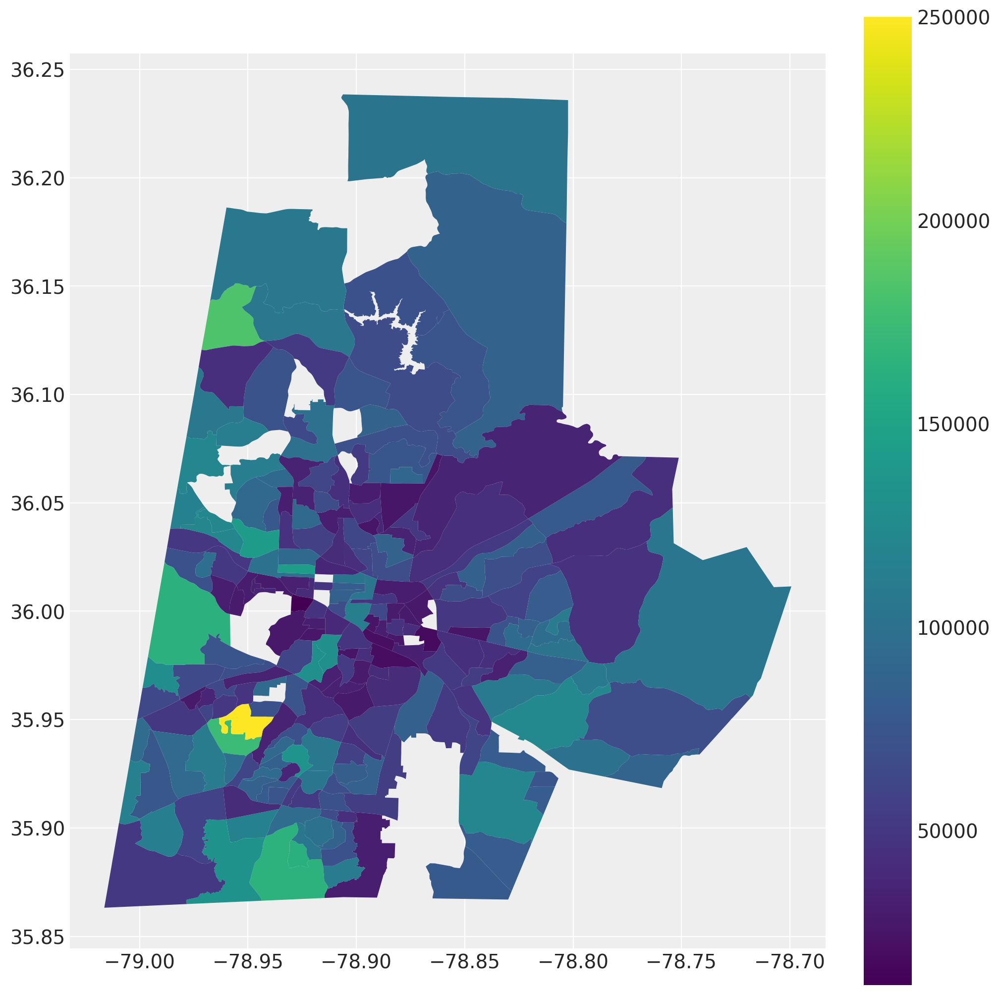

In [10]:
count_data.plot(column='income', legend=True, figsize=(10, 10))

In [11]:
import libpysal
from libpysal.weights import Rook

w = Rook.from_dataframe(count_data)

for no_income in no_income_mask.index:
    neighbors = w.neighbors[no_income]
    print(neighbors)
    print(count_data['income'][neighbors])
    no_income_neighbors = np.nanmean(count_data['income'].values[neighbors])

    count_data.loc[no_income, 'income'] = no_income_neighbors

[1, 195, 149, 166, 43, 44, 203]
1       75729.0
195         NaN
149         NaN
166    106750.0
43     111538.0
44      25058.0
203    105703.0
Name: income, dtype: float64
[160, 116, 52, 100, 87]
160     61750.0
116     92500.0
52     103101.0
100     44130.0
87      72891.0
Name: income, dtype: float64
[64, 194, 61, 62]
64     124000.0
194         NaN
61      60507.0
62      47803.0
Name: income, dtype: float64
[105, 82, 22]
105    24707.0
82     93681.0
22     65948.0
Name: income, dtype: float64
[156, 38, 168, 153, 43, 44, 157]
156     32069.0
38     122273.0
168    142994.0
153     46786.0
43     111538.0
44      25058.0
157     50444.0
Name: income, dtype: float64
[48, 212, 46, 191]
48      86029.0
212    101994.0
46     100057.0
191     84871.0
Name: income, dtype: float64
[131, 180, 181, 52]
131     44438.0
180     81250.0
181     47526.0
52     103101.0
Name: income, dtype: float64
[150, 103, 230, 199, 204, 142]
150     28897.0
103    111574.0
230     41500.0
199     70833.0
2

/var/folders/3r/mm1k6hx10zlgnb46j7vtvxz80000gq/T/ipykernel_47325/4120095736.py:4: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Rook.from_dataframe(count_data)


In [12]:
# Extract adjancency matrix from this weights object
adj = w.to_sparse().todense()

In [13]:
temp = count_data['eve_avg'].values

# Create a masked array from this array
temp = np.ma.array(temp, mask=np.isnan(temp))

In [14]:
temp_mean = temp.mean()

# Model 1
This model just looks at temperature like a spatial process.

In [15]:
with pm.Model() as m1:
    sigma = pm.InverseGamma('sigma', 1, 1)
    eps = pm.InverseGamma('eps', 1, 1)
    mu = pm.Normal('mu', mu = temp.mean(), sigma = 10)
    phi = pm.ICAR('phi', W=adj, zero_sum_stdev=10)

    # Likelihood
    T = pm.Normal('temp', mu + sigma*phi, sigma = eps, observed=temp)

    # Sample
    trace_1 = pm.sample(1000, tune=1000, chains=2, cores=2, target_accept=0.9)

/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/pymc/model/core.py:1323: ImputationWarning: Data in temp contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, eps, mu, phi, temp_unobserved]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 18 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


array([[<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'eps'}>, <Axes: title={'center': 'eps'}>],
       [<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>],
       [<Axes: title={'center': 'phi'}>, <Axes: title={'center': 'phi'}>]],
      dtype=object)

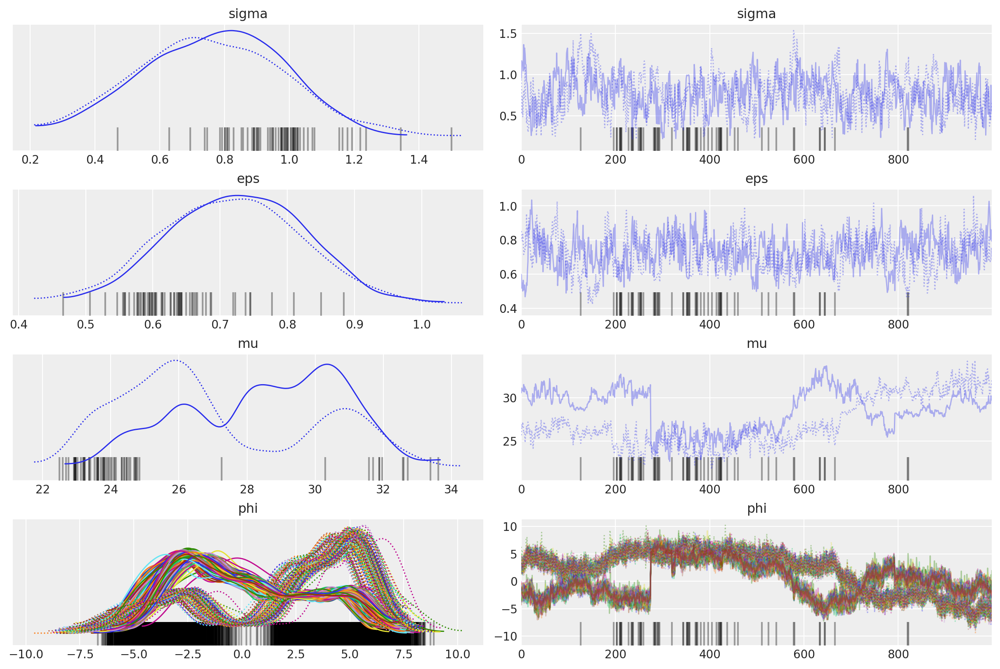

In [16]:
az.plot_trace(trace_1, var_names=['sigma', 'eps', 'mu', 'phi'])

<Axes: >

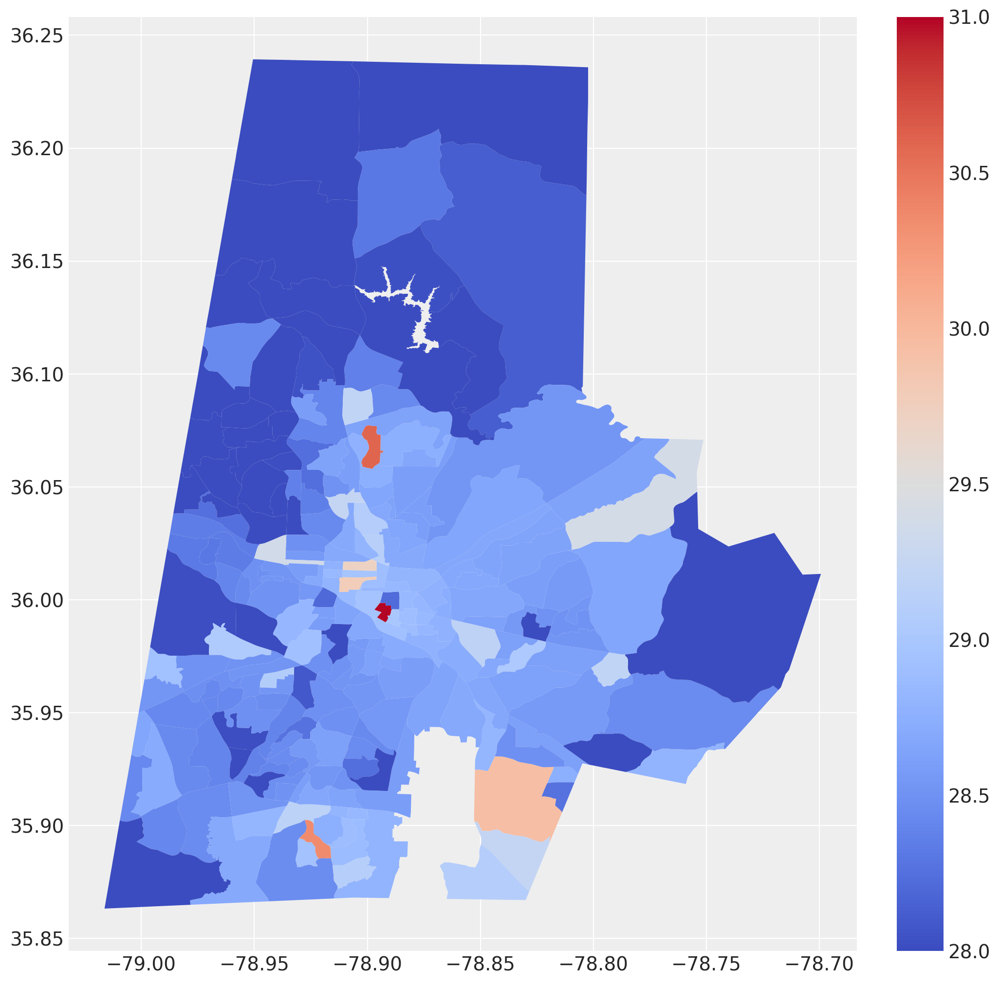

In [17]:
count_data['m1_temp'] = trace_1.posterior['temp'].mean(axis=(0, 1)).values
count_data.plot(column='m1_temp', legend=True, figsize=(10,10), cmap='coolwarm', vmax=31, vmin=28)

So, if we do no correcting, we would assume that the temperature is just the mean in the unobserved locations. This is probably a reasonable assumption, in the absence of all data.

# Model 2
In this model, we adjust for the spatial process to predict the intensity of temperature.

In [18]:
counts = count_data['num_stations'].values
population = count_data['population'].values / 1000

In [22]:
counts[counts > 0] = 1

In [24]:
with pm.Model() as m2:
    sigma = pm.InverseGamma('sigma', 1, 1)
    eps = pm.InverseGamma('eps', 1, 1)
    mu = pm.Normal('mu', mu = temp.mean(), sigma = 10)
    phi = pm.ICAR('phi', W=adj, zero_sum_stdev=0.01)

    theta_0 = pm.Normal('theta_0', mu = 0, sigma = 1)
    theta_1 = pm.Normal('theta_1', mu = 0, sigma = 1)
    theta_2 = pm.Normal('theta_2', mu = 0, sigma = 1)
    # Likelihood
    phi_spat = sigma*phi
    T = pm.Normal('temp', mu + phi_spat, sigma = eps, observed=temp)

    intensity = pm.math.sigmoid(theta_0 + theta_1*phi_spat + theta_2*population)
    # rates = intensity * population
    lam = pm.Bernoulli('lam', p = intensity, observed=counts)

    # Sample
    trace_2 = pm.sample(1000, tune=1000, chains=2, cores=2, target_accept=0.9)

/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/pymc/model/core.py:1323: ImputationWarning: Data in temp contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, eps, mu, phi, theta_0, theta_1, theta_2, temp_unobserved]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 10 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [25]:
az.summary(trace_2)

/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/zdc6/mambaforge/envs/pspws/lib/python

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,28.784,0.138,28.511,29.030,0.014,0.010,104.0,345.0,1.04
phi[0],0.389,0.569,-0.630,1.428,0.014,0.010,1586.0,1483.0,1.00
phi[1],0.420,0.540,-0.634,1.372,0.016,0.011,1160.0,1514.0,1.00
phi[2],0.527,1.003,-1.304,2.462,0.021,0.020,2215.0,1671.0,1.00
phi[3],0.169,0.455,-0.739,1.015,0.013,0.010,1294.0,1399.0,1.00
...,...,...,...,...,...,...,...,...,...
temp[230],29.520,0.937,27.931,31.408,0.045,0.032,433.0,731.0,1.01
temp[231],28.826,0.000,28.826,28.826,0.000,0.000,2000.0,2000.0,NaN
temp[232],28.992,0.825,27.310,30.411,0.020,0.014,1692.0,1489.0,1.00
temp[233],27.651,0.000,27.651,27.651,0.000,0.000,2000.0,2000.0,NaN


array([[<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'eps'}>, <Axes: title={'center': 'eps'}>],
       [<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>],
       [<Axes: title={'center': 'phi'}>, <Axes: title={'center': 'phi'}>],
       [<Axes: title={'center': 'theta_0'}>,
        <Axes: title={'center': 'theta_0'}>],
       [<Axes: title={'center': 'theta_1'}>,
        <Axes: title={'center': 'theta_1'}>],
       [<Axes: title={'center': 'theta_2'}>,
        <Axes: title={'center': 'theta_2'}>]], dtype=object)

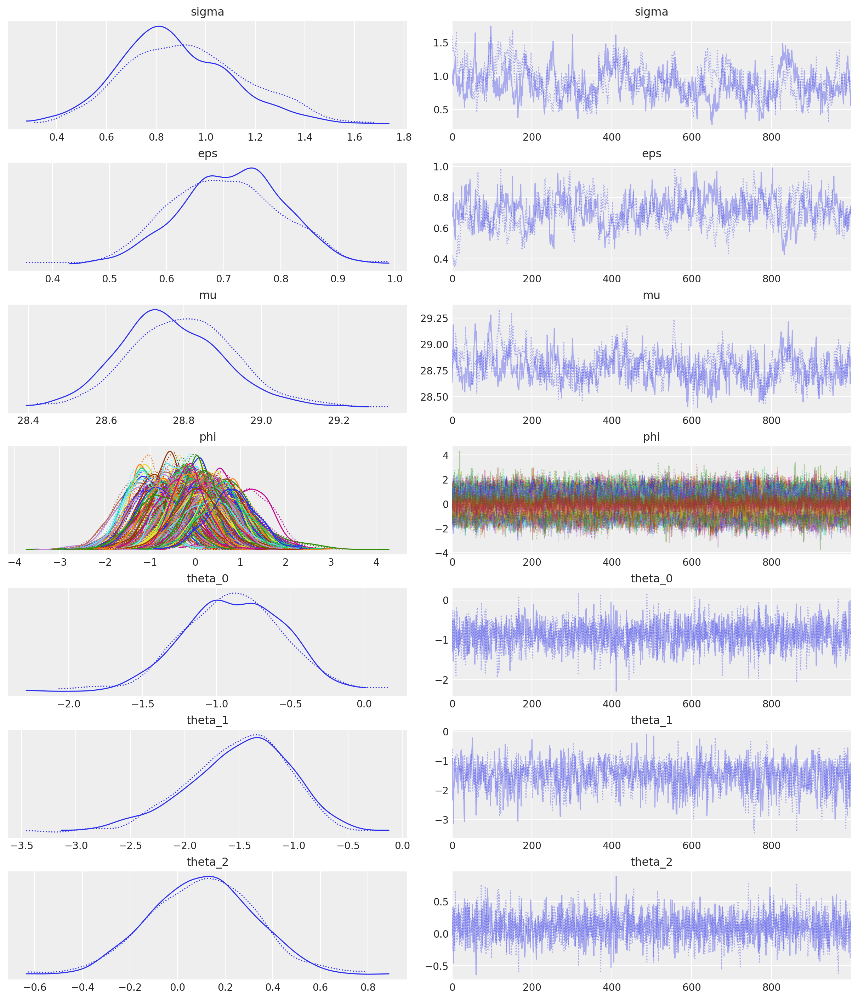

In [27]:
az.plot_trace(trace_2, var_names=['sigma', 'eps', 'mu', 'phi', 'theta_0', 'theta_1', 'theta_2'])

<Axes: >

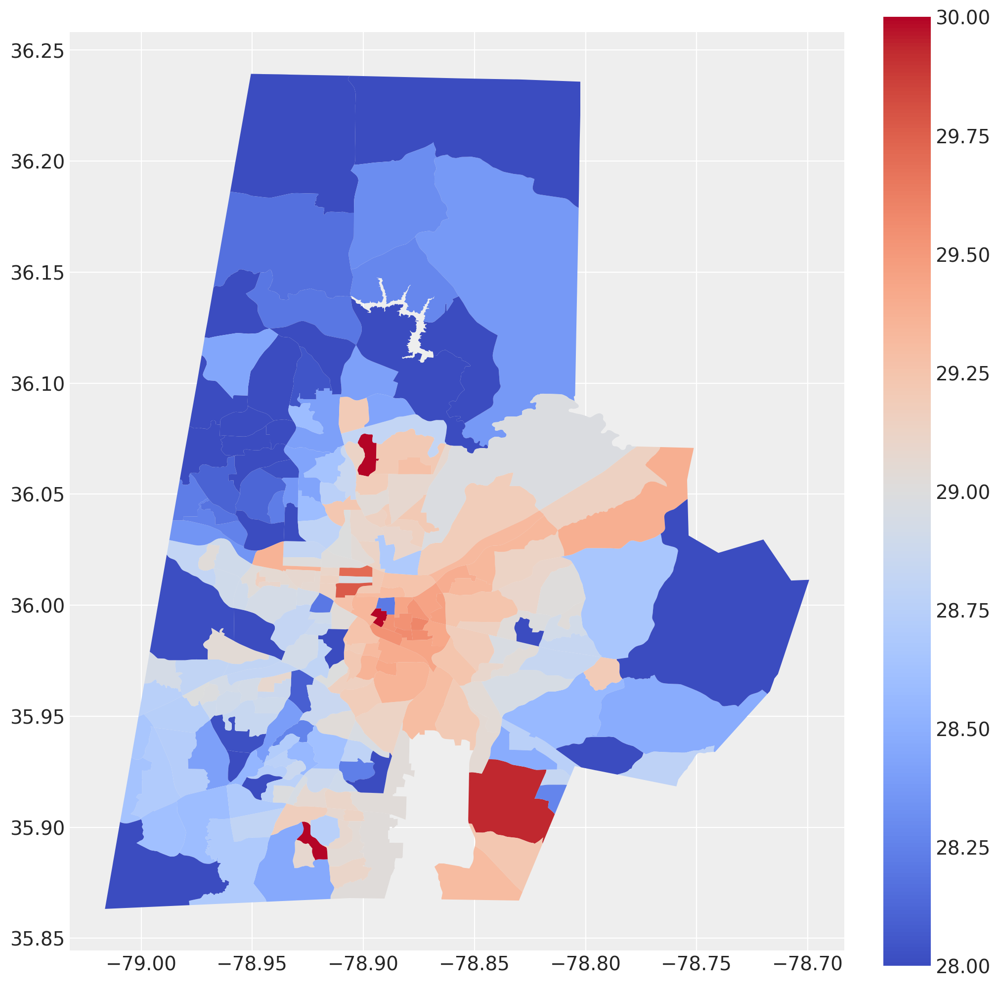

In [28]:
count_data['m2_temp'] = trace_2.posterior['temp'].mean(axis=(1))[1, :].values
count_data.plot(column='m2_temp', legend=True, figsize=(10,10), cmap='coolwarm', vmax=30, vmin=28)

When we adjust for preferential sampling, we simply see that the temperature is predicted to be warmer in all of the census tracts where there are no observations.

In [29]:
print(trace_1.posterior['mu'].mean().values)
print(trace_2.posterior['mu'].mean().values)

27.78279503634479
28.784481502572678


# Model 3
In this model, we look at adjusting temperature based on the income variable, to see if this adjustment provides us with more information.

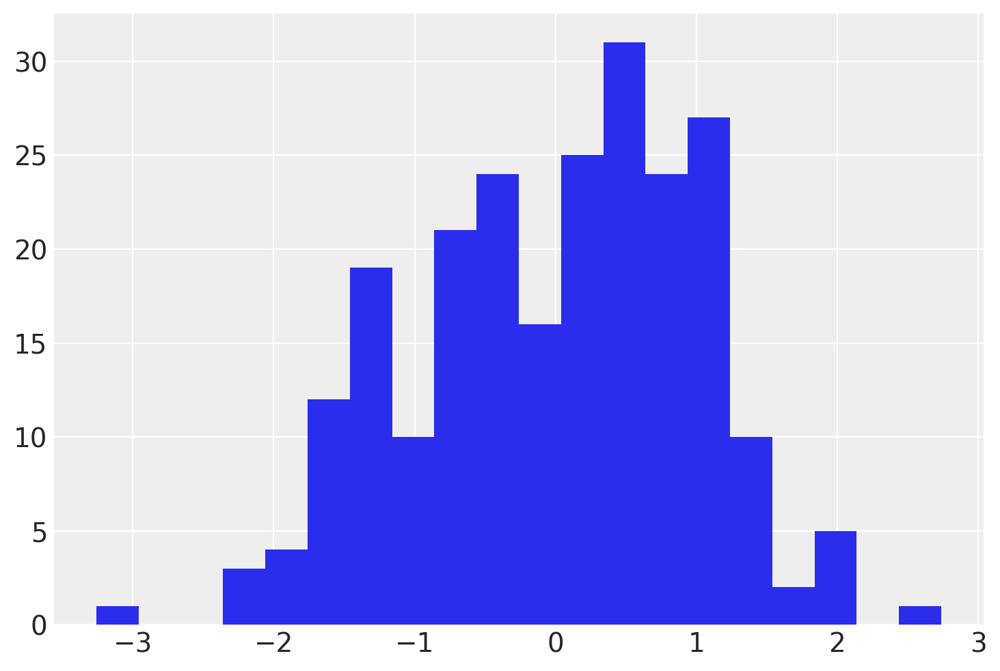

In [30]:
# Let's just normalize income
# mask = count_data['income'].isna()
log_income = np.log(count_data['income'].values)
# Turn this into a masked array with nan values turned to masks
# log_income = np.ma.masked_invalid(log_income)
# log_income = np.log(count_data['income'].values)
log_income_std = (log_income - np.mean(log_income)) / np.std(log_income)
plt.hist(log_income_std, bins=20)
plt.show()

In [31]:
with pm.Model() as m3:
    sigma = pm.Exponential('sigma', 1)
    eps = pm.Exponential('eps', 1)
    
    mu = pm.Normal('mu', mu = temp.mean(), sigma = temp.std())
    phi = pm.ICAR('phi', W=adj)

    beta_1 = pm.Normal('beta_1', mu=0, sigma=10)

    # Likelihood
    temp_est = mu + beta_1 * log_income_std + sigma*phi
    T = pm.Normal('temp', temp_est, sigma = eps, observed=temp)

    # Sample
    trace_3 = pm.sample(1000, tune=1000, chains=2, cores=2)#, target_accept=0.6)

/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/pymc/model/core.py:1323: ImputationWarning: Data in temp contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, eps, mu, phi, beta_1, temp_unobserved]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 23 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [32]:
az.summary(trace_3, var_names=['sigma', 'eps', 'mu', 'beta_1'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma,0.717,0.262,0.167,1.191,0.031,0.023,76.0,46.0,1.03
eps,0.683,0.107,0.508,0.904,0.013,0.009,77.0,34.0,1.02
mu,28.658,0.102,28.465,28.852,0.004,0.003,591.0,936.0,1.00
beta_1,-0.319,0.103,-0.509,-0.122,0.004,0.003,639.0,1016.0,1.01


array([[<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'eps'}>, <Axes: title={'center': 'eps'}>],
       [<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>],
       [<Axes: title={'center': 'beta_1'}>,
        <Axes: title={'center': 'beta_1'}>]], dtype=object)

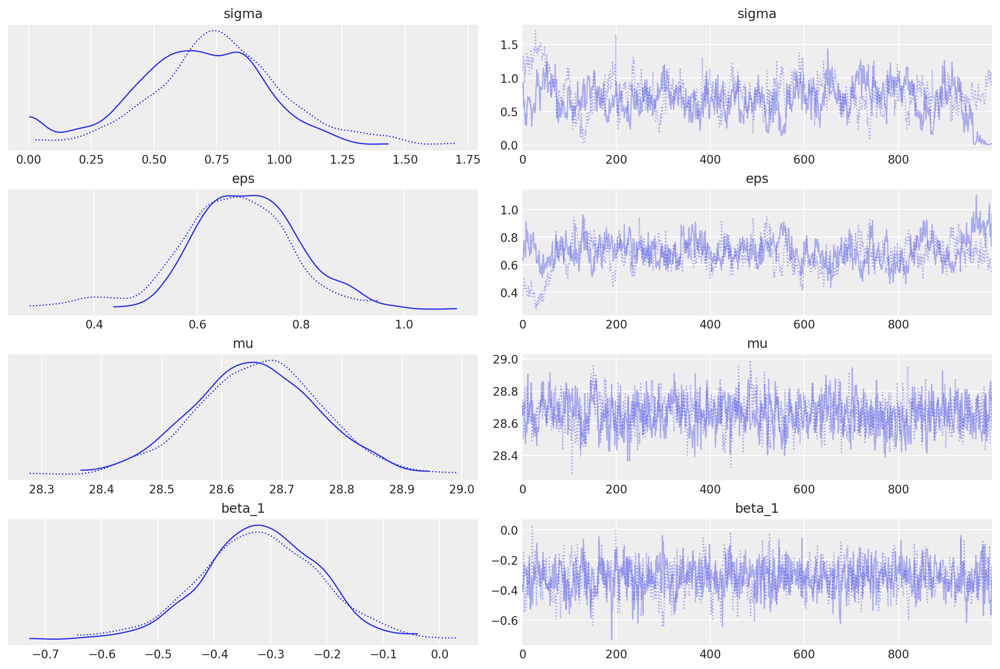

In [33]:
az.plot_trace(trace_3, var_names=['sigma', 'eps', 'mu', 'beta_1'])

<Axes: >

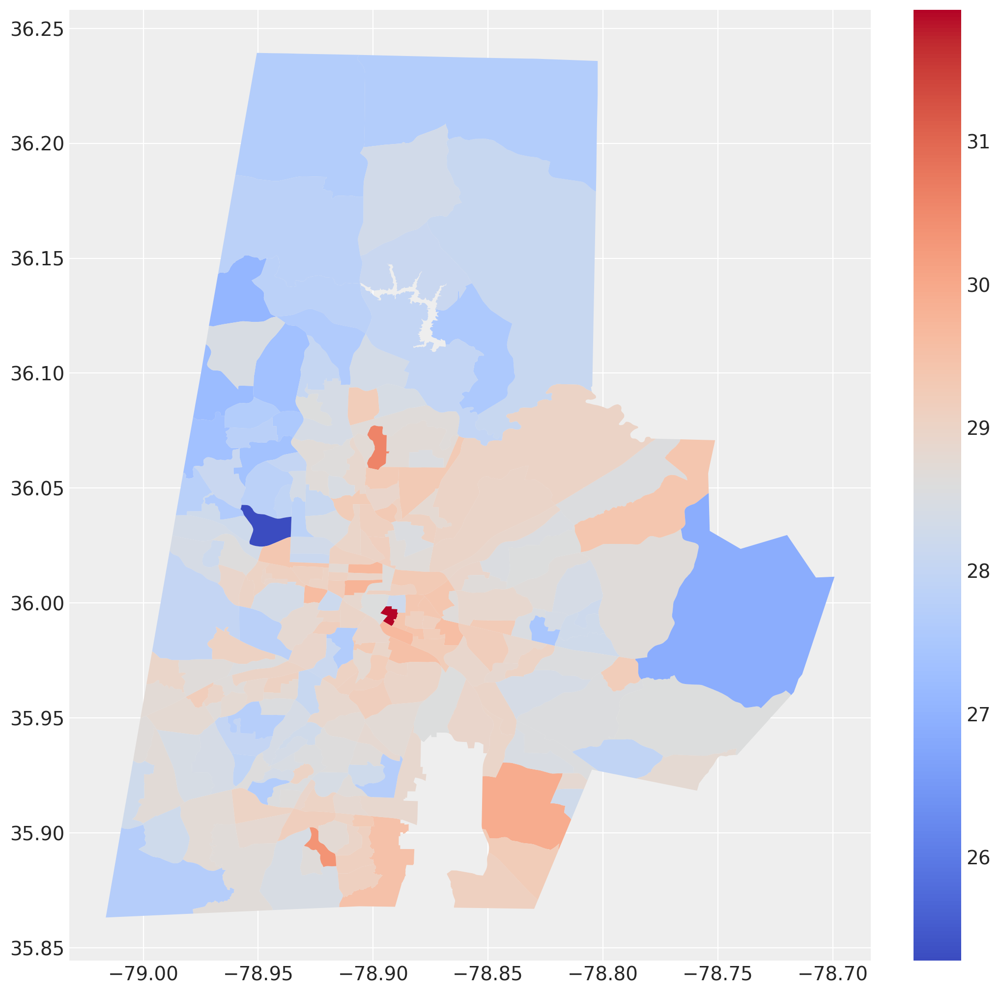

In [41]:
count_data['m3_temp'] = trace_3.posterior['temp'].mean(axis=(0,1)).values
count_data.plot(column='m3_temp', legend=True, figsize=(10,10), cmap='coolwarm')

With this model, we predict it is warmer based on income, without adjusting for preferential sampling. This provides us with a perhaps more reasonable map to look at.

# Model 4
Looking at the effect of income on temperature, and determining whether we still see a preferentially sampled relationship between temperature and number of stations

In [35]:
with pm.Model() as m4:
    sigma = pm.Exponential('sigma', 1)
    eps = pm.Exponential('eps', 1)
    mu = pm.Normal('mu', mu = temp.mean(), sigma = 100)
    phi = pm.ICAR('phi', W=adj)

    theta_0 = pm.Normal('theta_0', mu = 0, sigma = 10)
    theta_1 = pm.Normal('theta_1', mu = 0, sigma = 10)
    theta_2 = pm.Normal('theta_2', mu = 0, sigma = 10)
    theta_3 = pm.Normal('theta_3', mu = 0, sigma = 10) 
    beta_1 = pm.Normal('beta_1', mu=0, sigma=10)

    # Likelihood
    phi_spat = sigma*phi
    T = pm.Normal('temp', mu + beta_1*log_income_std + phi_spat, sigma = eps, observed=temp)

    intensity = pm.math.sigmoid(theta_0 + theta_1*phi_spat + theta_2*population + theta_3*log_income_std)
    # rates = intensity * population
    lam = pm.Bernoulli('lam', p = intensity, observed=counts)

    # Sample
    trace_4 = pm.sample(1000, tune=1000, chains=2, cores=2, target_accept=0.9)

/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/pymc/model/core.py:1323: ImputationWarning: Data in temp contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, eps, mu, phi, theta_0, theta_1, theta_2, theta_3, beta_1, temp_unobserved]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 34 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [36]:
az.summary(trace_4, var_names=['sigma', 'eps', 'mu', 'beta_1', 'theta_0', 'theta_1', 'theta_2'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma,0.621,0.280,0.122,1.155,0.045,0.032,38.0,36.0,1.02
eps,0.719,0.106,0.526,0.911,0.013,0.009,66.0,221.0,1.02
mu,28.759,0.135,28.516,29.022,0.017,0.012,61.0,304.0,1.02
beta_1,-0.330,0.106,-0.541,-0.142,0.005,0.003,516.0,1194.0,1.00
theta_0,-0.806,0.358,-1.496,-0.181,0.009,0.007,1479.0,1351.0,1.00
theta_1,-1.808,2.789,-4.369,0.428,0.520,0.379,139.0,43.0,1.01
theta_2,-0.003,0.231,-0.476,0.404,0.006,0.005,1581.0,1599.0,1.00


array([[<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'eps'}>, <Axes: title={'center': 'eps'}>],
       [<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>],
       [<Axes: title={'center': 'beta_1'}>,
        <Axes: title={'center': 'beta_1'}>],
       [<Axes: title={'center': 'theta_0'}>,
        <Axes: title={'center': 'theta_0'}>],
       [<Axes: title={'center': 'theta_1'}>,
        <Axes: title={'center': 'theta_1'}>],
       [<Axes: title={'center': 'theta_2'}>,
        <Axes: title={'center': 'theta_2'}>],
       [<Axes: title={'center': 'theta_3'}>,
        <Axes: title={'center': 'theta_3'}>]], dtype=object)

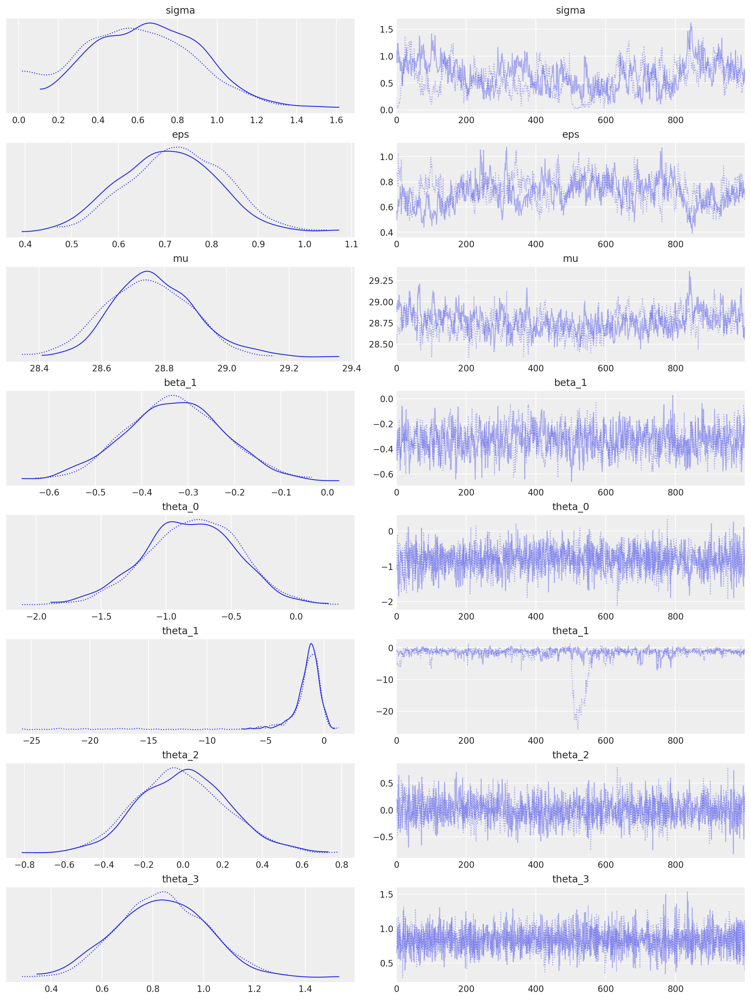

In [38]:
az.plot_trace(trace_4, var_names=['sigma', 'eps', 'mu', 'beta_1', 'theta_0', 'theta_1', 'theta_2', 'theta_3'])

<Axes: >

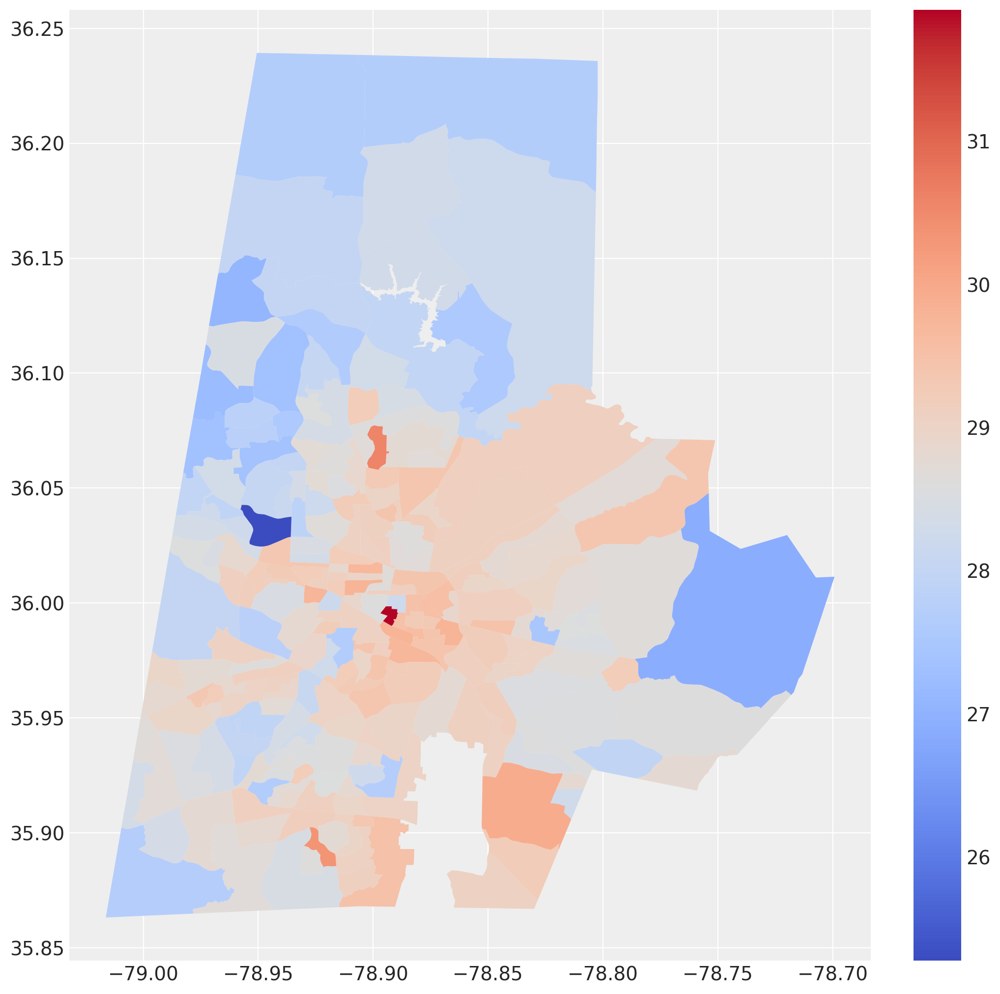

In [39]:
count_data['m4_temp'] = trace_4.posterior['temp'].mean(axis=(0,1)).values
count_data.plot(column='m4_temp', legend=True, figsize=(10,10), cmap='coolwarm')

Text(0.5, 1.0, 'Model 4')

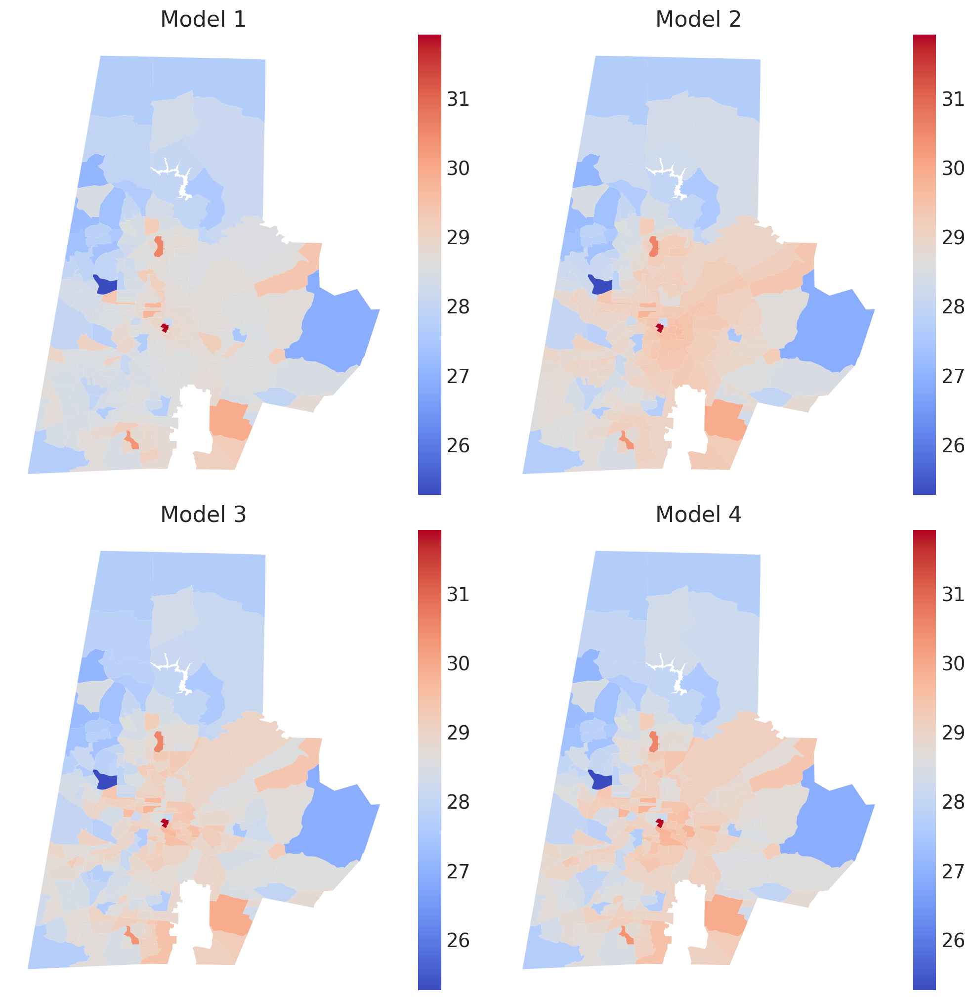

In [42]:
fig, [(ax1, ax2), (ax3, ax4)] = plt.subplots(2,2, figsize=(10,10))
# plt.subplot(2,1,1)
count_data.plot(column='m1_temp', ax=ax1, legend=True, cmap='coolwarm')
ax1.axis('off')
count_data.plot(column='m2_temp', ax=ax2, legend=True, cmap='coolwarm')
ax2.axis('off')
count_data.plot(column='m3_temp', ax=ax3, legend=True, cmap='coolwarm')
ax3.axis('off')
count_data.plot(column='m4_temp', ax=ax4, legend=True, cmap='coolwarm')
ax4.axis('off')

ax1.set_title('Model 1')
ax2.set_title('Model 2')
ax3.set_title('Model 3')
ax4.set_title('Model 4')

In [43]:
count_data[['m1_temp', 'm2_temp', 'm3_temp', 'm4_temp']].mean(axis=0)

m1_temp    28.530803
m2_temp    28.804666
m3_temp    28.660270
m4_temp    28.756457
dtype: float64

# Model 5
Final model -- look at explaining intensity, without using income to explain temperature.

In [44]:
with pm.Model() as m5:
    sigma = pm.Exponential('sigma', 1)
    eps = pm.Exponential('eps', 1)
    mu = pm.Normal('mu', mu = temp.mean(), sigma = 10)
    phi = pm.ICAR('phi', W=adj)

    theta_0 = pm.Normal('theta_0', mu = 0, sigma = 10)
    theta_1 = pm.Normal('theta_1', mu = 0, sigma = 10)
    theta_2 = pm.Normal('theta_2', mu = 0, sigma = 10)
    theta_3 = pm.Normal('theta_3', mu=0, sigma=10)

    # Likelihood
    phi_spat = sigma*phi
    T = pm.Normal('temp', mu + phi_spat, sigma = eps, observed=temp)

    intensity = pm.math.sigmoid(theta_0 + theta_1*phi_spat + theta_2*population + theta_3*log_income_std)
    # rates = intensity * population
    lam = pm.Bernoulli('lam', p = intensity, observed=counts)

    # Sample
    trace_5 = pm.sample(1000, tune=1000, chains=2, cores=2, target_accept=0.95)

/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/pymc/model/core.py:1323: ImputationWarning: Data in temp contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, eps, mu, phi, theta_0, theta_1, theta_2, theta_3, temp_unobserved]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 37 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [45]:
az.summary(trace_5, var_names=['sigma', 'eps', 'mu', 'theta_0', 'theta_1', 'theta_2'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma,0.615,0.324,0.002,1.135,0.063,0.045,26.0,45.0,1.09
eps,0.768,0.118,0.527,0.968,0.016,0.012,53.0,158.0,1.05
mu,28.602,0.138,28.337,28.847,0.016,0.011,74.0,284.0,1.03
theta_0,-0.777,0.360,-1.461,-0.132,0.012,0.009,909.0,1025.0,1.00
theta_1,-1.572,2.225,-6.383,1.140,0.376,0.268,60.0,33.0,1.02
theta_2,-0.021,0.238,-0.479,0.409,0.008,0.005,961.0,1293.0,1.00


array([[<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'eps'}>, <Axes: title={'center': 'eps'}>],
       [<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>],
       [<Axes: title={'center': 'theta_0'}>,
        <Axes: title={'center': 'theta_0'}>],
       [<Axes: title={'center': 'theta_1'}>,
        <Axes: title={'center': 'theta_1'}>],
       [<Axes: title={'center': 'theta_2'}>,
        <Axes: title={'center': 'theta_2'}>]], dtype=object)

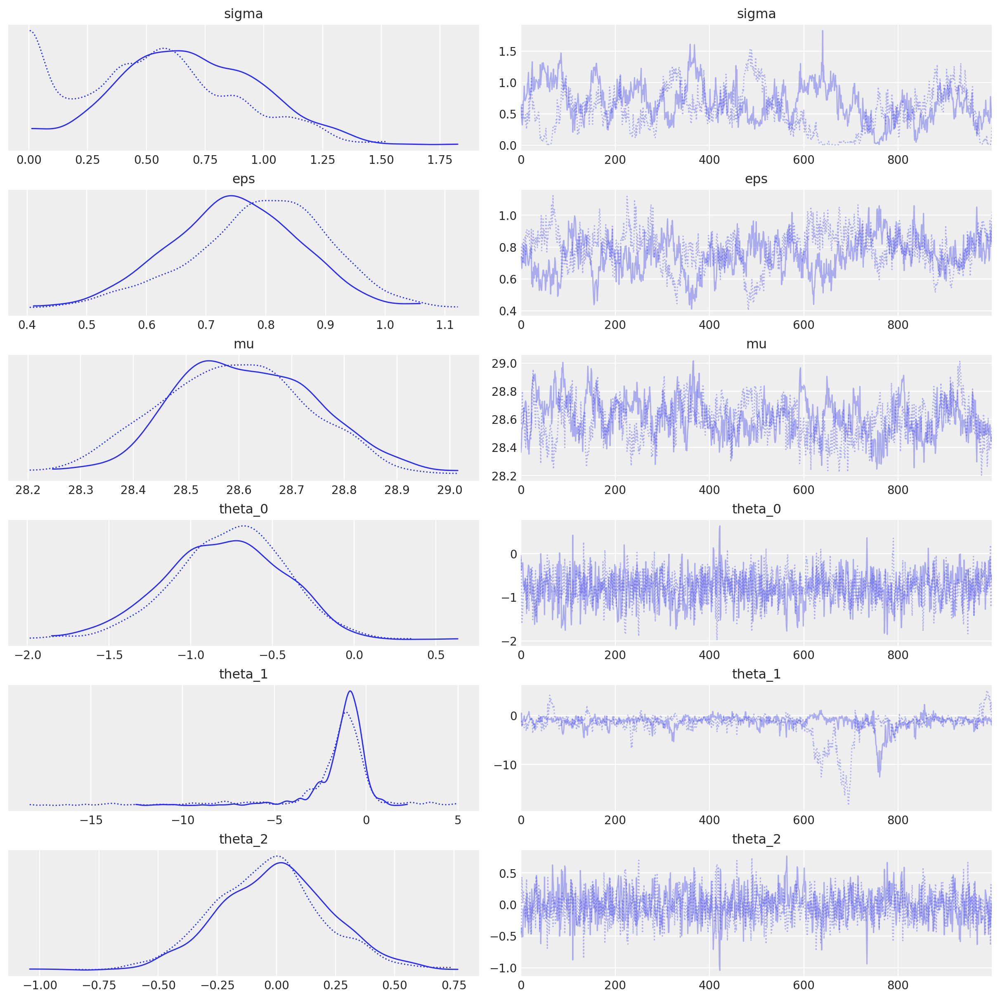

In [46]:
az.plot_trace(trace_5, var_names=['sigma', 'eps', 'mu', 'theta_0', 'theta_1', 'theta_2'])

<Axes: >

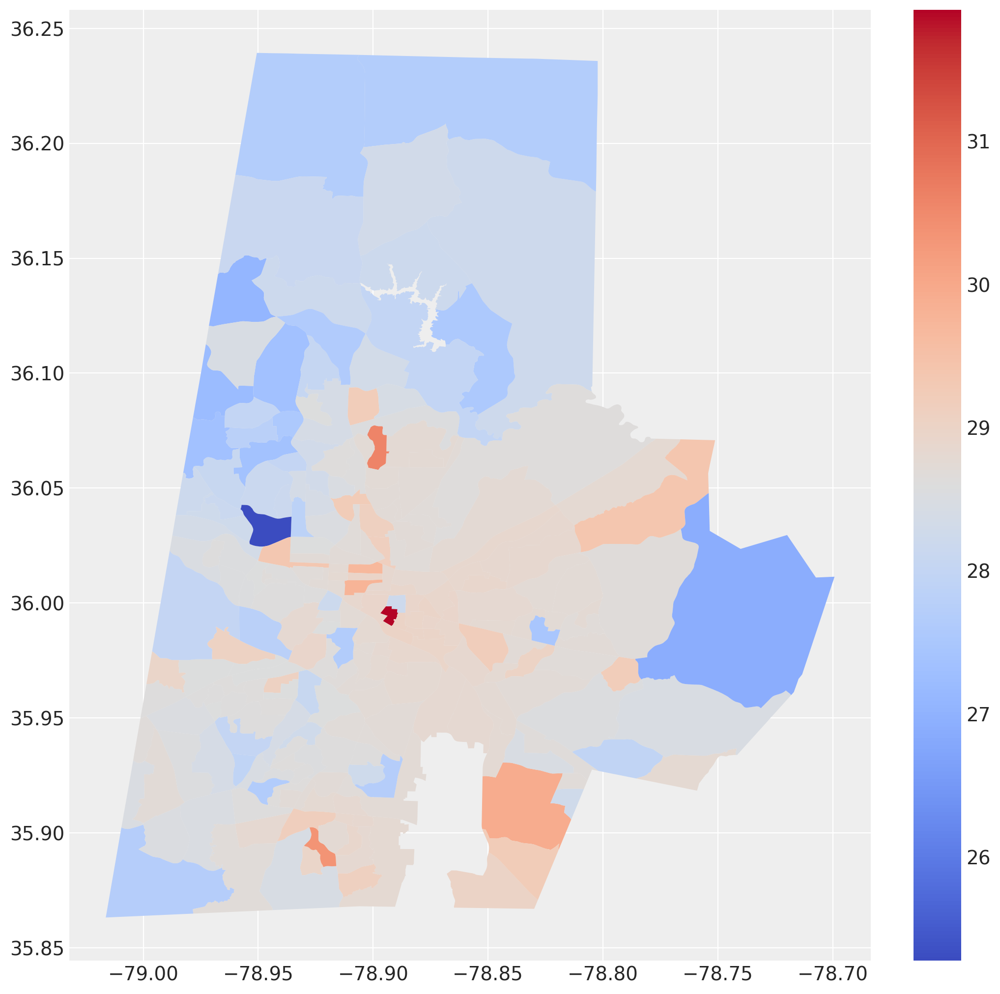

In [48]:
count_data['m5_temp'] = trace_5.posterior['temp'].mean(axis=(0,1)).values
count_data.plot(column='m5_temp', legend=True, figsize=(10,10), cmap='coolwarm')

# Model comparison with traversal data

In [49]:
trav = gpd.read_file('../data/raw/temperature/traversal/pm_trav.shp')

# Only keep Durham
trav = trav[trav.geometry.x < -78.8]

tract_traversal = gpd.sjoin(count_data, trav, op='contains')

tract_avg = pd.pivot_table(tract_traversal, index='geoid', values='temp_f', aggfunc='mean')

tract_avg.head()

/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3493: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
/var/folders/3r/mm1k6hx10zlgnb46j7vtvxz80000gq/T/ipykernel_47325/2682223057.py:6: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: GEOGCS["unknown",DATUM["WGS_1984",SPHEROID["WGS 84 ...

  tract_traversal = gpd.sjoin(count_data, trav, op='contains')


,temp_f
geoid,
370630001011,79.244658
370630001012,78.637620
370630001022,79.026076
370630001023,78.527578
370630001024,78.015644


In [50]:
# Reset the index
tract_avg = tract_avg.reset_index()

# Convert temp_f to celsius
tract_avg['trav_temp_c'] = (tract_avg['temp_f'] - 32) * 5/9

# Merge count data with tract_avg
count_data_w_trav = count_data.merge(tract_avg, how='outer', left_on='geoid', right_on='geoid')

In [51]:
print(len(count_data_w_trav))

235


In [52]:
count_data_w_trav[['m1_temp', 'm2_temp', 'm3_temp', 'm4_temp', 'm5_temp', 'trav_temp_c']].corr()

,m1_temp,m2_temp,m3_temp,m4_temp,m5_temp,trav_temp_c
m1_temp,1.000000,0.925847,0.915258,0.893184,0.988887,-0.089961
m2_temp,0.925847,1.000000,0.921168,0.944381,0.956834,-0.040183
m3_temp,0.915258,0.921168,1.000000,0.989624,0.916077,0.090182
m4_temp,0.893184,0.944381,0.989624,1.000000,0.913792,0.074701
m5_temp,0.988887,0.956834,0.916077,0.913792,1.000000,-0.092236
trav_temp_c,-0.089961,-0.040183,0.090182,0.074701,-0.092236,1.000000


In [53]:
# Load the preprocessed spatial causal model data
scm_bg = pd.read_csv('../data/preprocessed/spatial_causal_model_results/by_block_group.csv')

scm_bg.head()

,geoid,temp,confound,no_unobs,counfound_dp
0,0,26.394690,0.160840,26.253919,0.134647
1,370630001011,26.242741,-0.813138,27.055879,-0.398611
2,370630001012,25.724601,-1.009002,26.733603,-0.496682
3,370630001021,25.932258,-1.373066,27.305325,-0.277743
4,370630001022,25.946321,-0.746686,26.693007,-0.330941


In [54]:
# Remove columns
scm_bg.rename(columns={
    'temp': 'scm_temp',
}, inplace=True)
scm_bg.head()

,geoid,scm_temp,confound,no_unobs,counfound_dp
0,0,26.394690,0.160840,26.253919,0.134647
1,370630001011,26.242741,-0.813138,27.055879,-0.398611
2,370630001012,25.724601,-1.009002,26.733603,-0.496682
3,370630001021,25.932258,-1.373066,27.305325,-0.277743
4,370630001022,25.946321,-0.746686,26.693007,-0.330941


In [55]:
scm_bg['scm_temp_dp'] = scm_bg['scm_temp'] - scm_bg['counfound_dp']

In [56]:
scm_bg.dtypes

geoid             int64
scm_temp        float64
confound        float64
no_unobs        float64
counfound_dp    float64
scm_temp_dp     float64
dtype: object

In [57]:
# Turn geoid into integer col
count_data_w_trav['geoid'] = count_data_w_trav['geoid'].astype(int)

In [58]:
len(count_data_w_trav)

235

In [59]:
# Merge with the count data
cd_w_trav_and_scm = count_data_w_trav.merge(scm_bg, left_on='geoid', right_on='geoid')

In [60]:
cd_w_trav_and_scm[['m1_temp', 'm2_temp', 'm3_temp', 'm4_temp', 'm5_temp', 'trav_temp_c', 'scm_temp', 'no_unobs', 'confound', 'scm_temp_dp']].corr()

,m1_temp,m2_temp,m3_temp,m4_temp,m5_temp,trav_temp_c,scm_temp,no_unobs,confound,scm_temp_dp
m1_temp,1.000000,0.914224,0.895855,0.871887,0.987162,-0.089961,0.070649,0.255308,-0.110499,0.267682
m2_temp,0.914224,1.000000,0.902672,0.929508,0.949534,-0.040183,0.112922,0.347249,-0.126909,0.354802
m3_temp,0.895855,0.902672,1.000000,0.988409,0.896750,0.090182,0.184593,0.371794,-0.045913,0.369248
m4_temp,0.871887,0.929508,0.988409,1.000000,0.895091,0.074701,0.187965,0.378293,-0.046613,0.371545
m5_temp,0.987162,0.949534,0.896750,0.895091,1.000000,-0.092236,0.087109,0.259636,-0.090973,0.273049
trav_temp_c,-0.089961,-0.040183,0.090182,0.074701,-0.092236,1.000000,0.873109,0.494563,0.860521,0.741684
scm_temp,0.070649,0.112922,0.184593,0.187965,0.087109,0.873109,1.000000,0.715253,0.818156,0.696974
no_unobs,0.255308,0.347249,0.371794,0.378293,0.259636,0.494563,0.715253,1.000000,0.183378,0.844661
confound,-0.110499,-0.126909,-0.045913,-0.046613,-0.090973,0.860521,0.818156,0.183378,1.000000,0.285663
scm_temp_dp,0.267682,0.354802,0.369248,0.371545,0.273049,0.741684,0.696974,0.844661,0.285663,1.000000


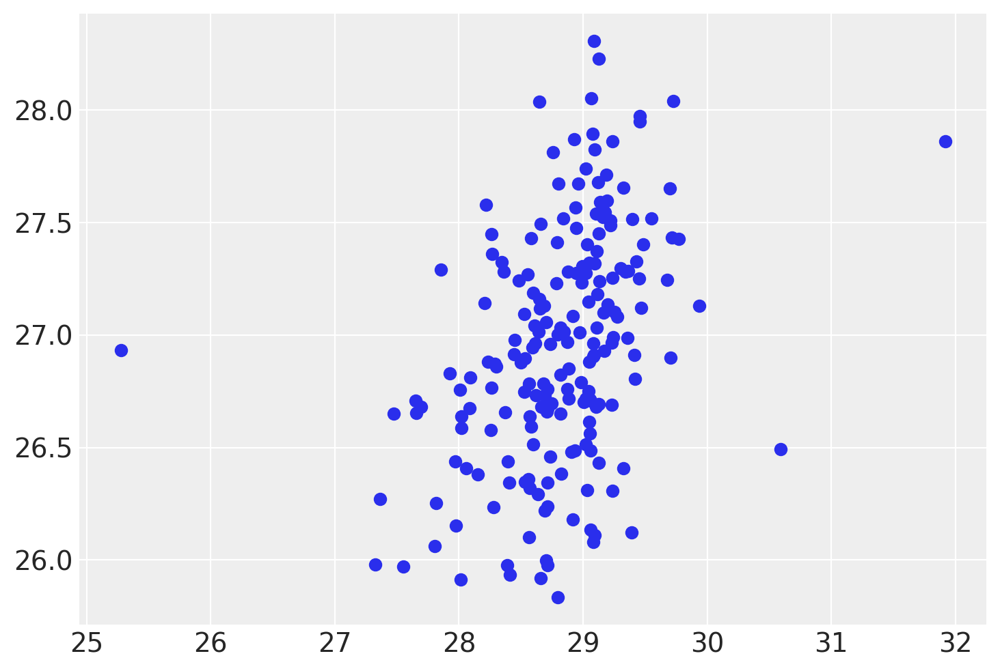

In [93]:
plt.scatter(cd_w_trav_and_scm['m4_temp'], cd_w_trav_and_scm['no_unobs'])

In [106]:
cd_w_trav_and_scm.head()

,geoid,income,area,population,num_stations,eve_avg,geometry,m1_temp,m2_temp,m3_temp,m4_temp,m5_temp,temp_f,trav_temp_c,scm_temp,confound,no_unobs,counfound_dp,scm_temp_dp
0,370630001011,68558.0,1888610.0,1240.0,1,28.700269,"POLYGON ((-78.89489 36.02991, -78.89343 36.030...",28.700269,28.700269,28.700269,28.700269,28.700269,79.244658,26.247032,26.242741,-0.813138,27.055879,-0.398611,26.641352
1,370630001012,86699.0,1481712.0,2476.0,0,NaN,"POLYGON ((-78.89232 36.03489, -78.89154 36.035...",28.693938,28.953197,28.474340,28.620517,28.707428,78.637620,25.909789,25.724601,-1.009002,26.733603,-0.496682,26.221283
2,370630001021,41250.0,1176041.0,1742.0,0,NaN,"POLYGON ((-78.91655 36.02532, -78.91635 36.025...",28.725618,28.882555,28.965955,28.993849,28.613690,NaN,NaN,25.932258,-1.373066,27.305325,-0.277743,26.210001
3,370630001022,61538.0,726961.0,660.0,1,29.124863,"POLYGON ((-78.90229 36.02877, -78.90197 36.028...",29.124863,29.124863,29.124863,29.124863,29.124863,79.026076,26.125598,25.946321,-0.746686,26.693007,-0.330941,26.277262
4,370630001023,44130.0,707011.0,644.0,0,NaN,"POLYGON ((-78.90554 36.02556, -78.90554 36.026...",28.787385,28.850908,29.049221,29.008120,28.625668,78.527578,25.848655,25.739972,-0.960751,26.700723,-0.281185,26.021157


So, we see the highest correlation between model 5 and the temperature traversal data. This is SUPER interesting, and it demonstrates that we do in fact correct for the bias much better when we apply preferential sampling.

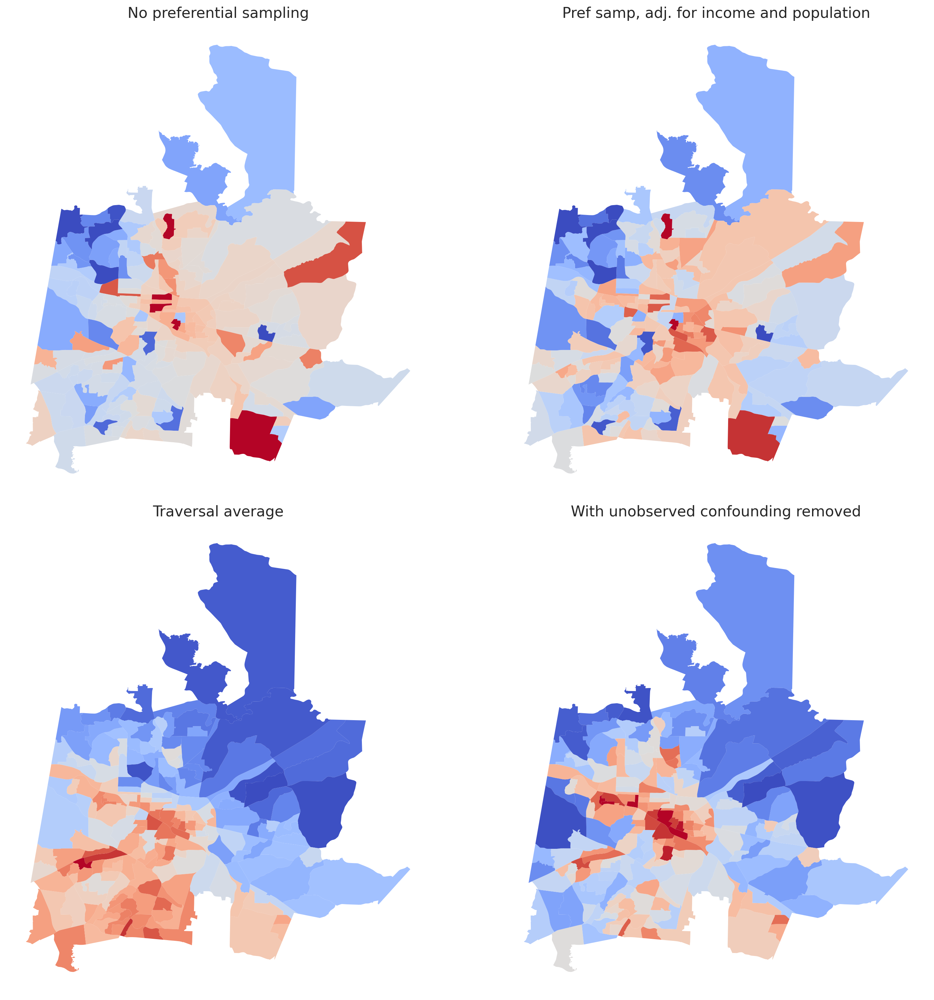

In [62]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize=(15,15))
# plt.subplot(2,1,1)
# Calc std dev
std_dev = cd_w_trav_and_scm['m1_temp'].std()
mean = cd_w_trav_and_scm['m1_temp'].mean()
cd_w_trav_and_scm.plot(
    column='m1_temp', 
    ax=ax1, cmap='coolwarm', 
    vmin = mean - 2*std_dev,
    vmax = mean + 2*std_dev,
    missing_kwds={'color': 'lightyellow'}, 
    # legend=True, 
    legend_kwds={'label': "July 2023 Evening Temp (C)", "orientation": "horizontal"})
ax1.axis('off')
ax1.set_title("No preferential sampling")
# ax1.plot(wu_data['longitude'], wu_data['latitude'], 'k.')#, label='stations')

std_dev = cd_w_trav_and_scm['m4_temp'].std()
mean = cd_w_trav_and_scm['m4_temp'].mean()
cd_w_trav_and_scm.plot(
    column='m4_temp', 
    ax=ax2, 
    cmap='coolwarm', 
    # legend=True, 
    # legend_kwds={'label': "July 2023 Evening Temp (C)", "orientation": "horizontal"}, 
    vmin=mean - 2*std_dev, 
    vmax=mean + 2*std_dev)
ax2.axis('off')
ax2.set_title("Pref samp, adj. for income and population")

# Plot traversal temperature
std_dev = cd_w_trav_and_scm['scm_temp'].std()
mean = cd_w_trav_and_scm['scm_temp'].mean()
cd_w_trav_and_scm.plot(column='scm_temp', 
    ax=ax3, 
    cmap='coolwarm', 
    missing_kwds={'color': 'lightyellow'},
    # legend=True, legend_kwds={'label': "July 23, 2021 Evening Temp (C)", "orientation": "horizontal"}
    vmin=mean - 2*std_dev,
    vmax=mean + 2*std_dev)
ax3.axis('off')
ax3.set_title("Traversal average")
# Add a comment on ax2 saying no data
# ax3.text(-78.91, 36.15, "No data", fontsize=12)

# Plot traversal temperature
std_dev = cd_w_trav_and_scm['no_unobs'].std()
mean = cd_w_trav_and_scm['no_unobs'].mean()
cd_w_trav_and_scm.plot(column='no_unobs', ax=ax4, cmap='coolwarm', 
    missing_kwds={'color': 'lightyellow'},
    # legend=True, legend_kwds={'label': "July 23, 2021 Evening Temp (C)", "orientation": "horizontal"}
    vmin=mean - 2*std_dev,
    vmax=mean + 2*std_dev)
ax4.axis('off')
ax4.set_title("With unobserved confounding removed")
# Add a comment on ax2 saying no data
# ax4.text(-78.91, 36.15, "No data", fontsize=12)

# Save this figure
plt.savefig('../results/by_census_tract/with_pref_sampled.png', dpi=300, bbox_inches='tight')
plt.show()

In [124]:
# Save the dataframe
cd_w_trav_and_scm.to_file('../results/by_block_group/model_results_2024_01_26.shp')

/var/folders/3r/mm1k6hx10zlgnb46j7vtvxz80000gq/T/ipykernel_24969/1619535579.py:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  cd_w_trav_and_scm.to_file('../results/by_block_group/model_results_2024_01_26.shp')


# Compare the distributions

In [126]:
cd_w_trav_and_scm.head()

,geoid,income,area,population,num_stations,eve_avg,geometry,m1_temp,m2_temp,m3_temp,m4_temp,m5_temp,temp_f,trav_temp_c,scm_temp,confound,no_unobs,counfound_dp,scm_temp_dp
0,370630001011,68558.0,1888610.0,1240.0,1,28.700269,"POLYGON ((-78.89489 36.02991, -78.89343 36.030...",28.700269,28.700269,28.700269,28.700269,28.700269,79.244658,26.247032,26.242741,-0.813138,27.055879,-0.398611,26.641352
1,370630001012,86699.0,1481712.0,2476.0,0,NaN,"POLYGON ((-78.89232 36.03489, -78.89154 36.035...",28.693938,28.953197,28.474340,28.620517,28.707428,78.637620,25.909789,25.724601,-1.009002,26.733603,-0.496682,26.221283
2,370630001021,41250.0,1176041.0,1742.0,0,NaN,"POLYGON ((-78.91655 36.02532, -78.91635 36.025...",28.725618,28.882555,28.965955,28.993849,28.613690,NaN,NaN,25.932258,-1.373066,27.305325,-0.277743,26.210001
3,370630001022,61538.0,726961.0,660.0,1,29.124863,"POLYGON ((-78.90229 36.02877, -78.90197 36.028...",29.124863,29.124863,29.124863,29.124863,29.124863,79.026076,26.125598,25.946321,-0.746686,26.693007,-0.330941,26.277262
4,370630001023,44130.0,707011.0,644.0,0,NaN,"POLYGON ((-78.90554 36.02556, -78.90554 36.026...",28.787385,28.850908,29.049221,29.008120,28.625668,78.527578,25.848655,25.739972,-0.960751,26.700723,-0.281185,26.021157


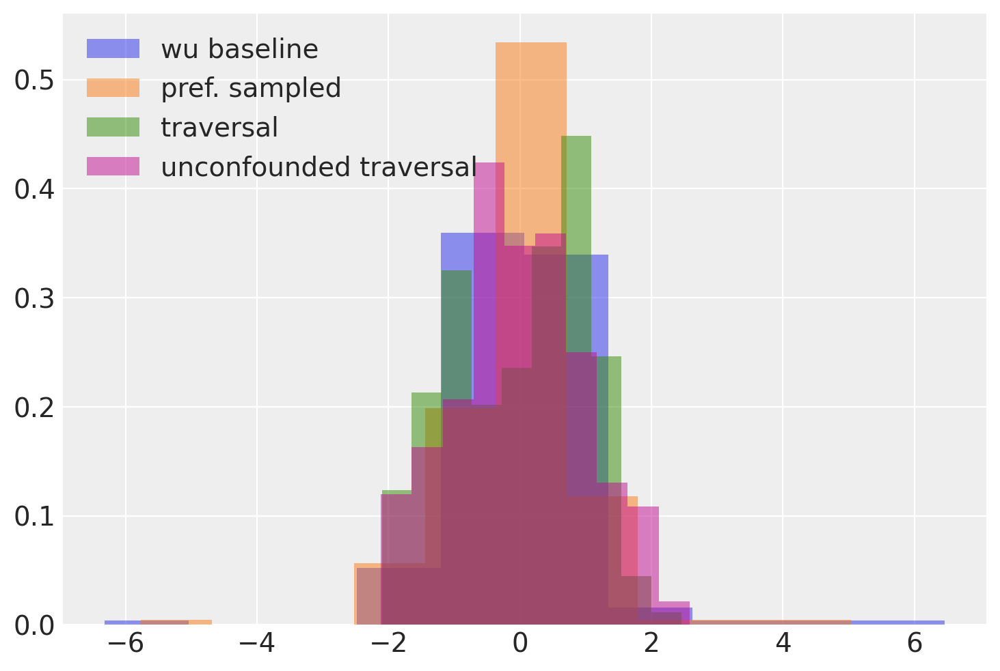

In [65]:
def normalize(temp):
    mu = temp.mean()
    std = temp.std()

    return (temp - mu) / std

plt.hist(normalize(cd_w_trav_and_scm['m1_temp']), density=True, alpha=0.5, label='wu baseline')
plt.hist(normalize(cd_w_trav_and_scm['m4_temp']), density = True, alpha=0.5, label='pref. sampled')
plt.hist(normalize(cd_w_trav_and_scm['scm_temp']), density=True, alpha=0.5, label='traversal')
plt.hist(normalize(cd_w_trav_and_scm['no_unobs']), density= True, alpha=0.5, label='unconfounded traversal')
plt.legend()

In [145]:
print(np.std(cd_w_trav_and_scm['m1_temp']))
print(np.std(cd_w_trav_and_scm['m2_temp']))
print(np.std(cd_w_trav_and_scm['scm_temp']))
print(np.std(cd_w_trav_and_scm['no_unobs']))

0.5254652462453998
0.5362887158036087
0.8984764577865388
0.5245469243019438


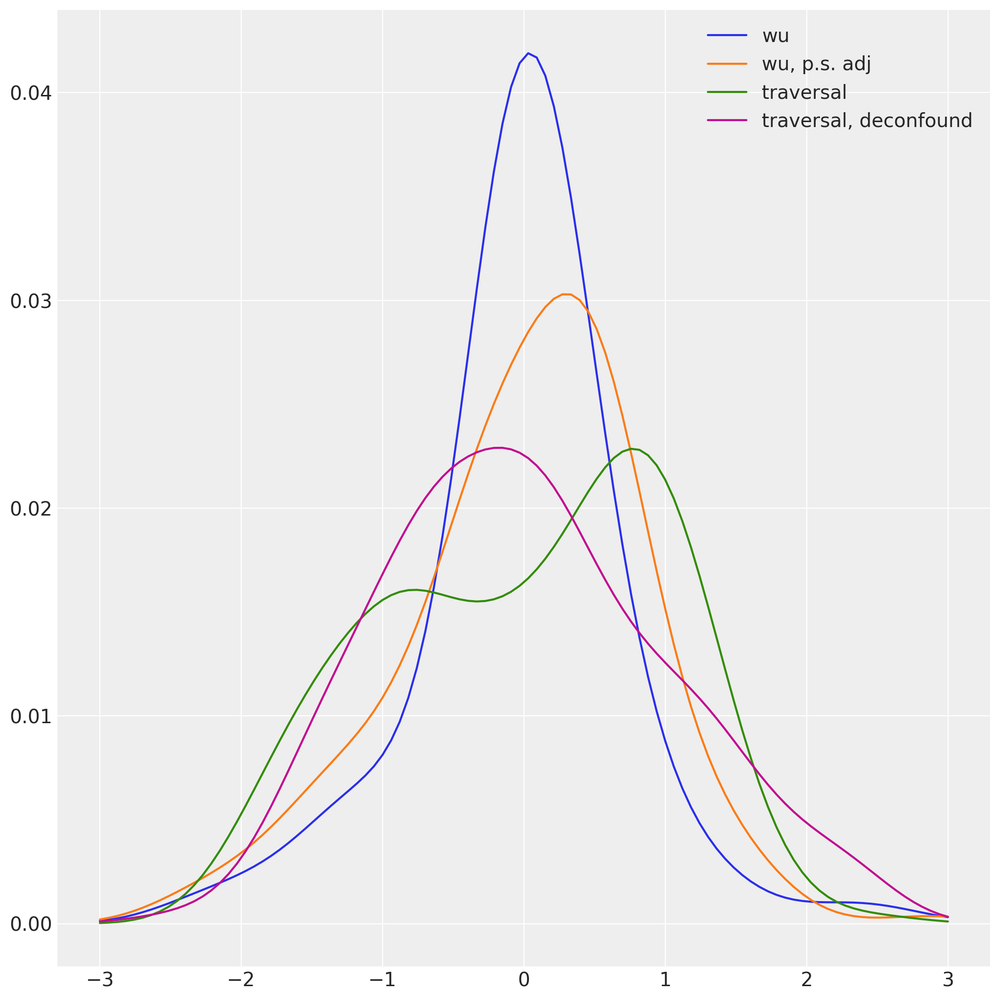

In [67]:
# Apply kernel density estimation to the data
from scipy.stats import gaussian_kde

def plot_kde(temp, ax, label):
    temp_n = normalize(temp)
    kde = gaussian_kde(temp_n)
    x = np.linspace(-3, 3, 100)
    total = np.sum([kde(x_) for x_ in x])
    ax.plot(x, kde(x) / total, label=label)

fig, ax = plt.subplots(1,1, figsize=(10,10))

plot_kde(cd_w_trav_and_scm['m1_temp'], ax, 'wu')
plot_kde(cd_w_trav_and_scm['m4_temp'], ax, 'wu, p.s. adj')
plot_kde(cd_w_trav_and_scm['scm_temp'], ax, 'traversal')
plot_kde(cd_w_trav_and_scm['scm_temp_dp'], ax, 'traversal, deconfound')
ax.legend()